In [1]:
%load_ext autoreload
%autoreload 2
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()
import os
os.chdir('..')

In [2]:
import torch, random
torch.manual_seed(0)
torch.cuda.manual_seed(0)
np.random.seed(0)
random.seed(0)

dataset_params = {
    'dataset': 'celeba64',
    'batch_size': 32,
    'cuda': False,
    'root': 'data'
}

from src.utils import get_datasets
train_loader, test_loader, (width, height, channels) = get_datasets(
    **dataset_params)

Loading celeba64 dataset...
Done!



# ConvVSC

In [3]:
%%time
from src.models.conv_vsc import ConvolutionalVariationalSparseCoding

model_params = {
    'dataset': 'celeba64',
    'width': width,
    'height': height,
    'channels': channels,
    'kernel_szs': '32,32,64,64',
    'hidden_sz': 256,
    'latent_sz': 200,
    'learning_rate': 3e-4,
    
    'alpha': 0.01,
    'beta': 2,
    'beta_delta': 0,
    'c': 50,
    'c_delta': 1e-3,
    
    'device': 'cpu',
    'log_interval': 500,
    'normalize': False,
    'flatten': False,
}

convvsc = ConvolutionalVariationalSparseCoding(**model_params)

CPU times: user 808 ms, sys: 116 ms, total: 924 ms
Wall time: 6.17 s


In [6]:
import torch
convvsc.model.load_state_dict(torch.load(
    'results/checkpoints/ConvVSC_celeba64_31_60_200_0-0003_90.pth', 
    map_location='cpu'))

In [7]:
images, _ = iter(test_loader).next()
sns.reset_orig()

/home/raduviri/anaconda3/envs/chana/lib/python3.6/site-packages/torch/nn/functional.py:1332: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


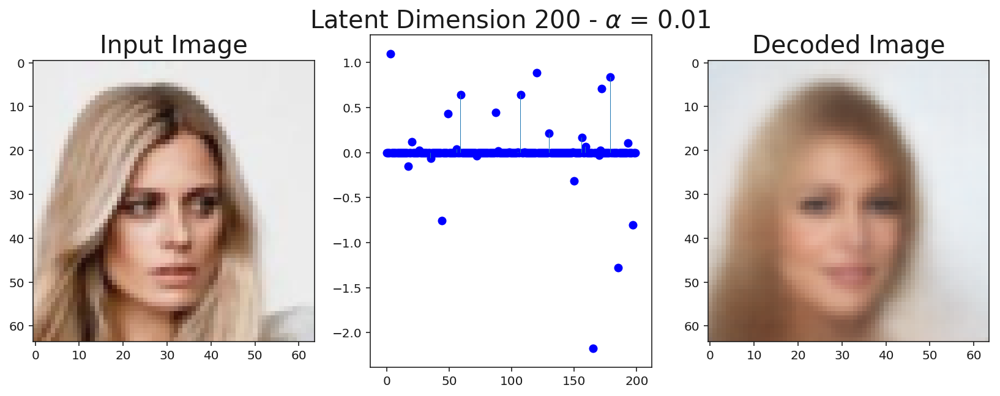

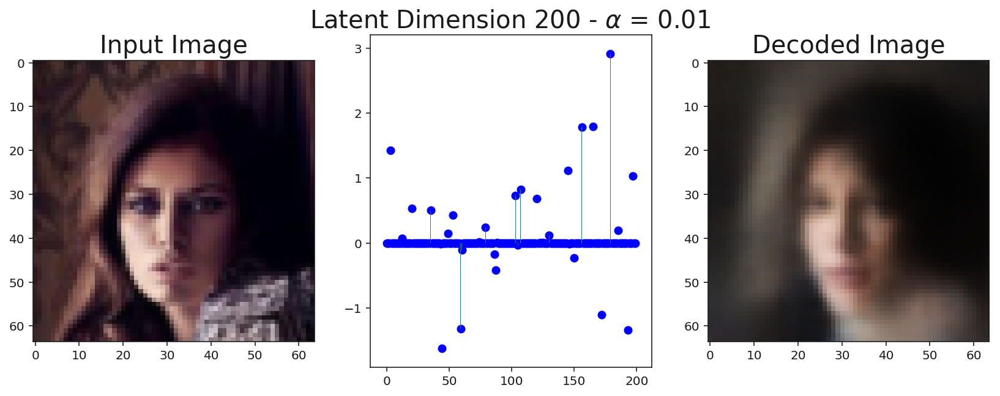

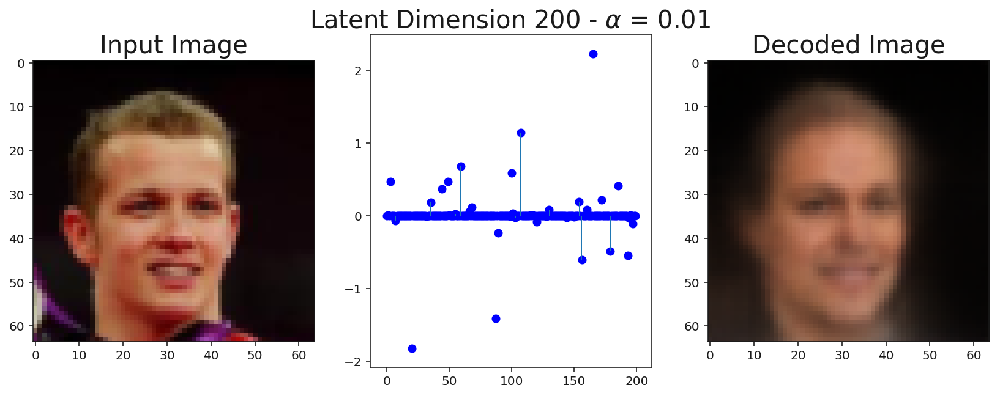

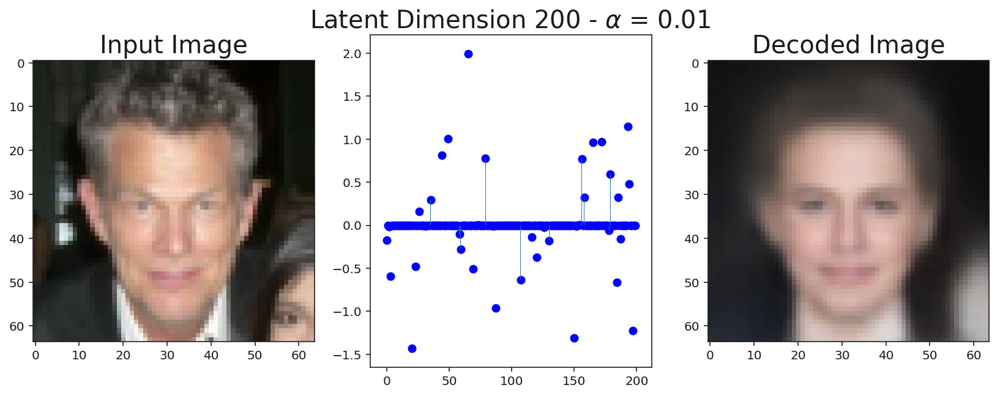

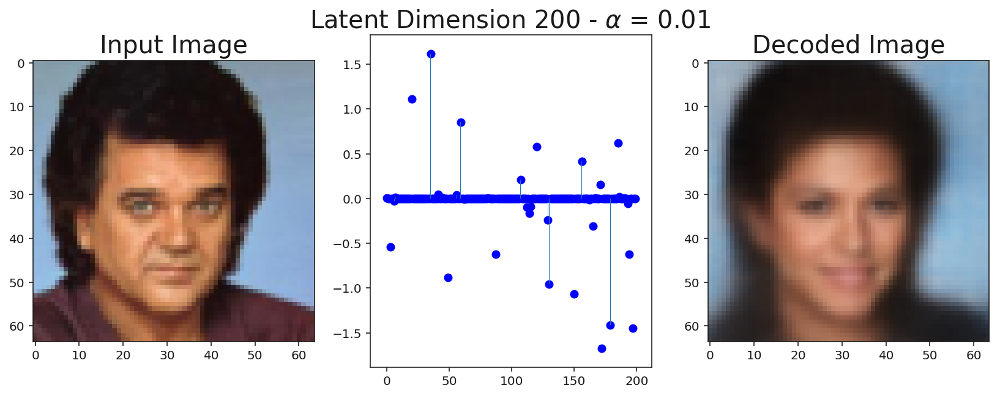

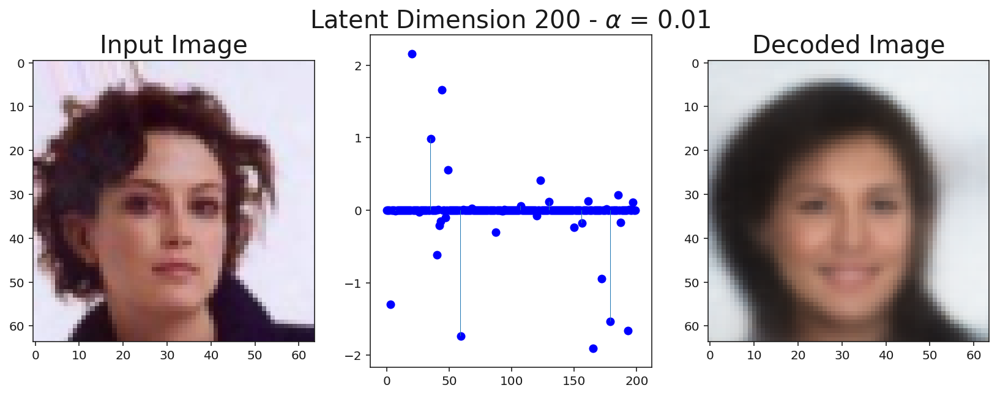

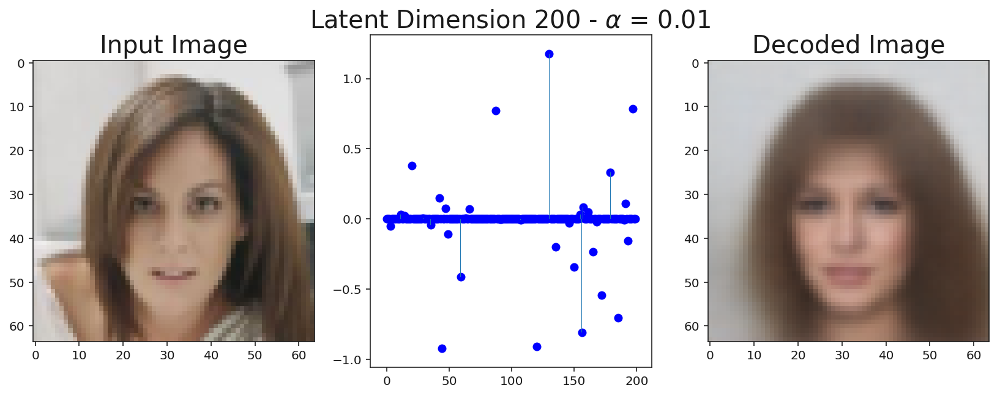

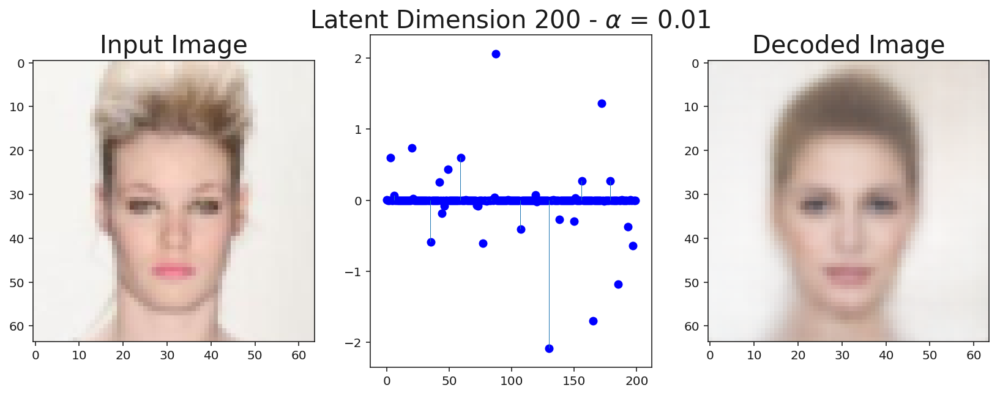

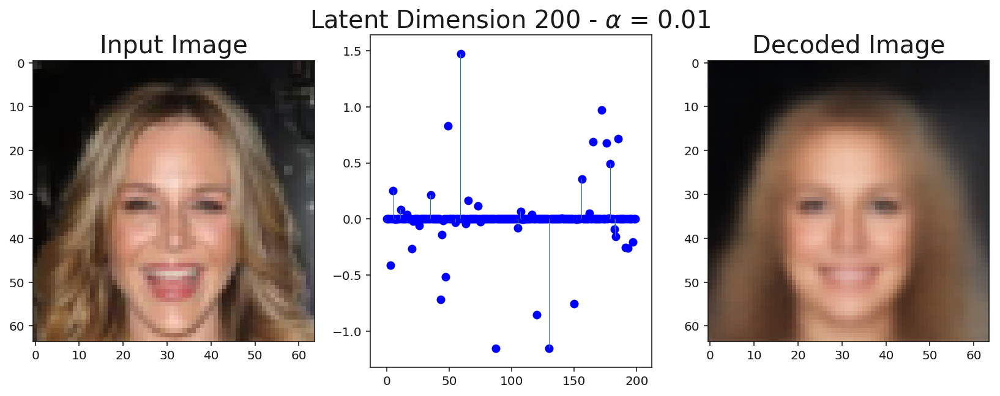

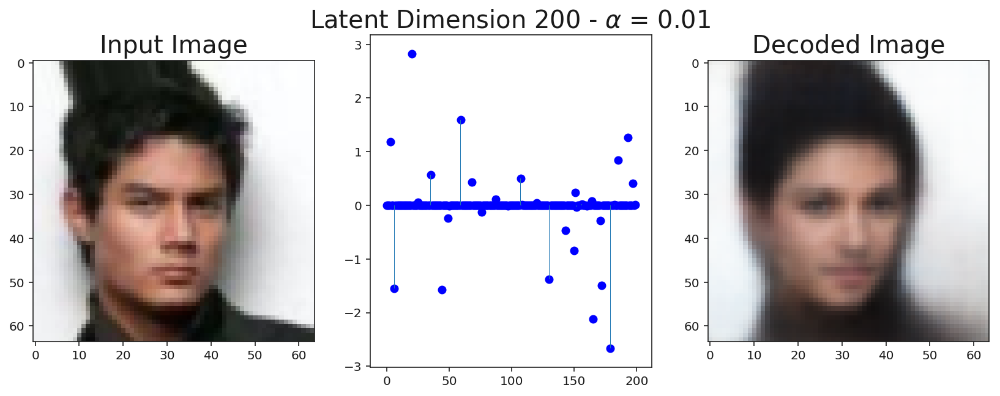

In [8]:
from src.plots import plot_encoding
for i in range(10):
    plot_encoding(images[i][None,:], convvsc, 
                  model_params['latent_sz'], 
                  model_params['alpha'])

/home/raduviri/anaconda3/envs/chana/lib/python3.6/site-packages/torch/nn/functional.py:1332: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


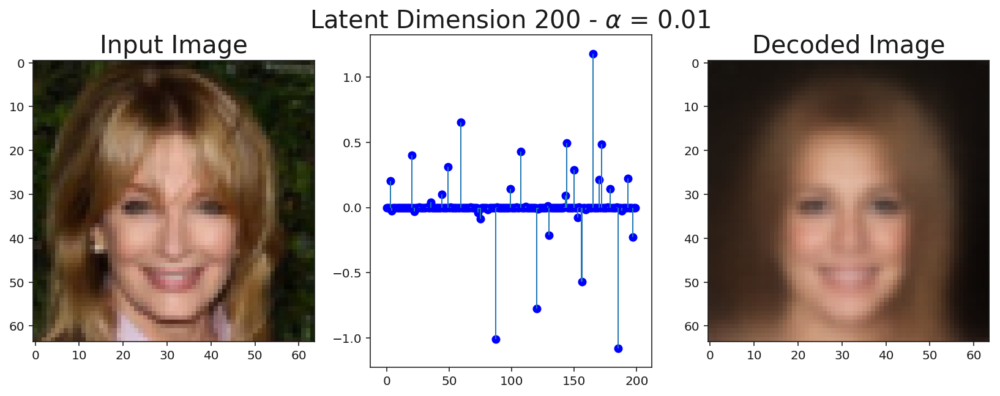

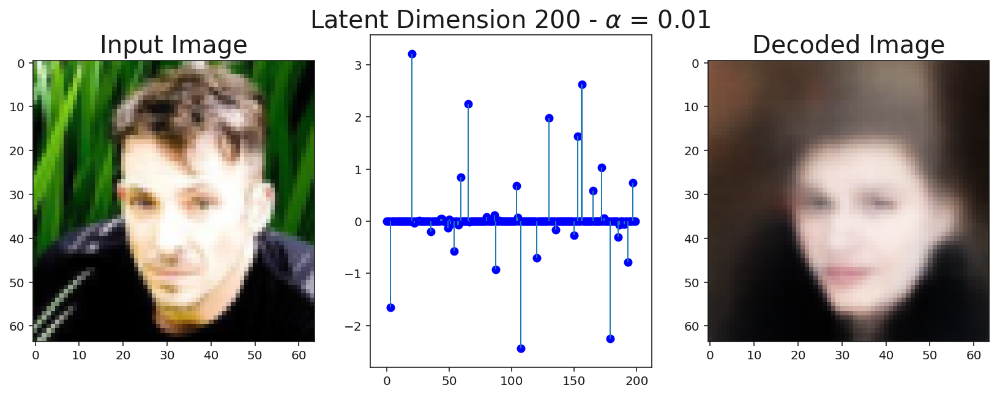

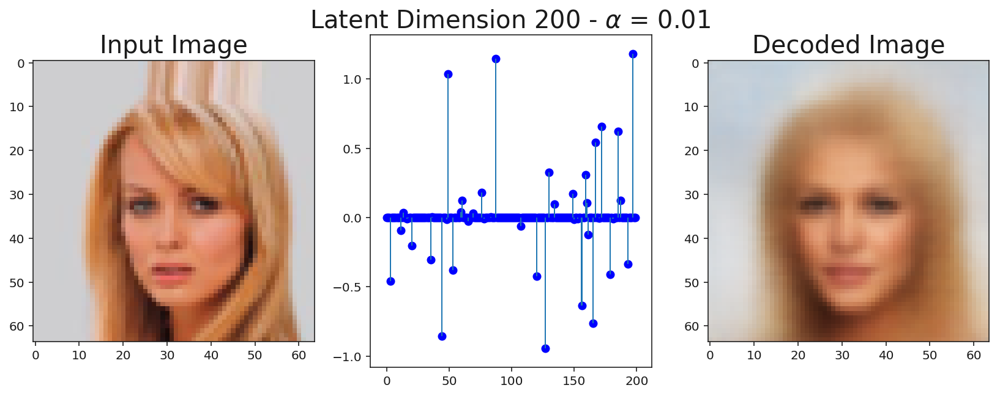

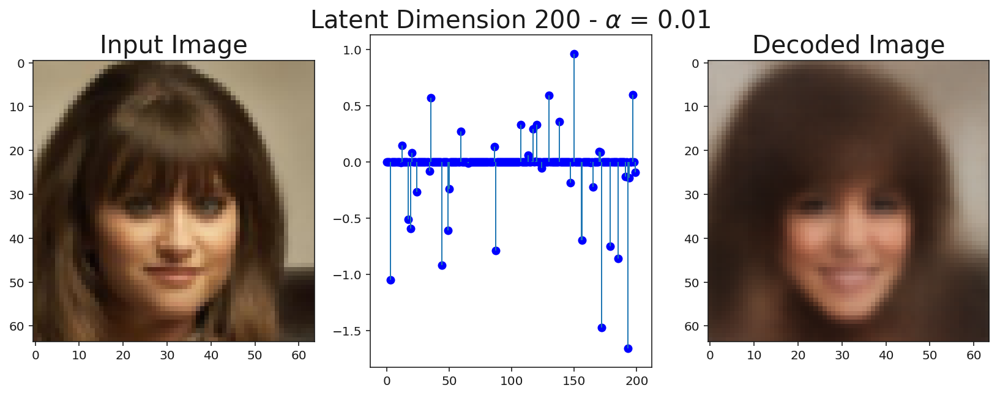

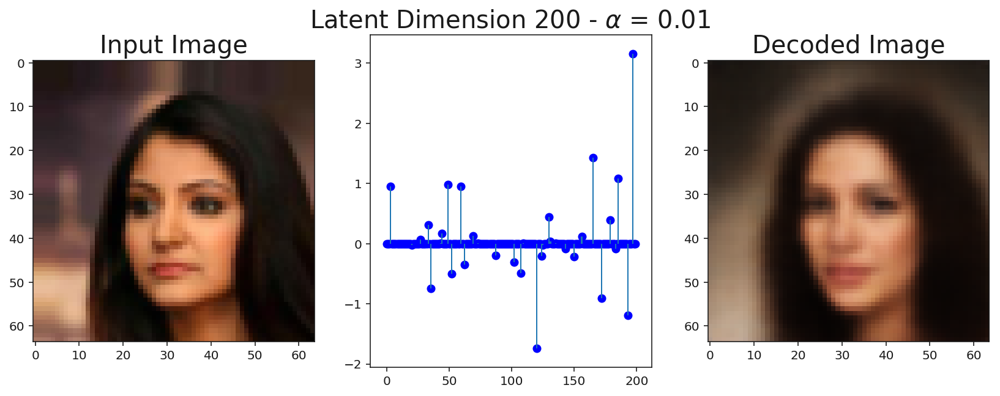

...

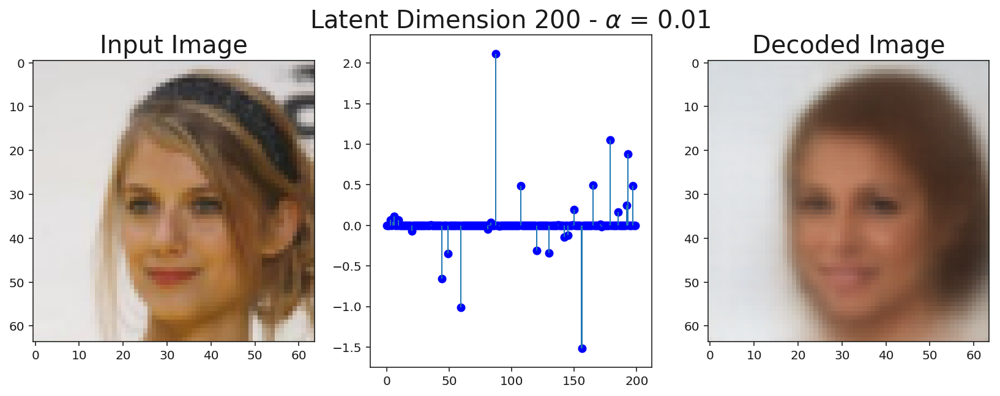

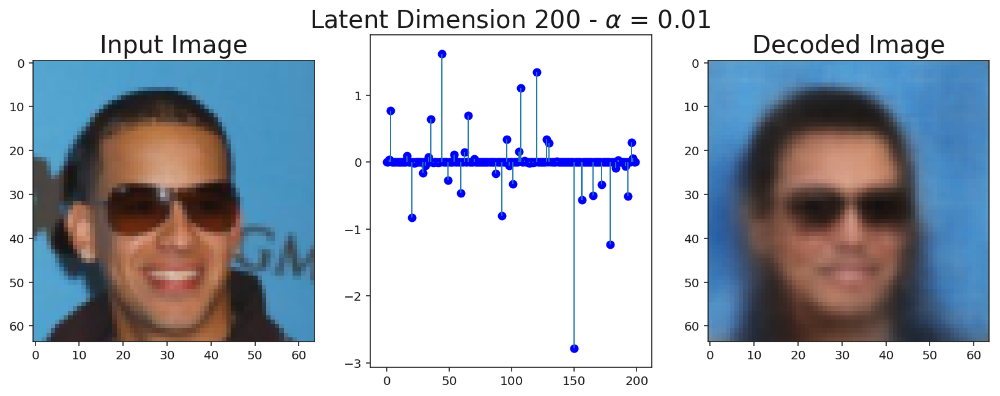

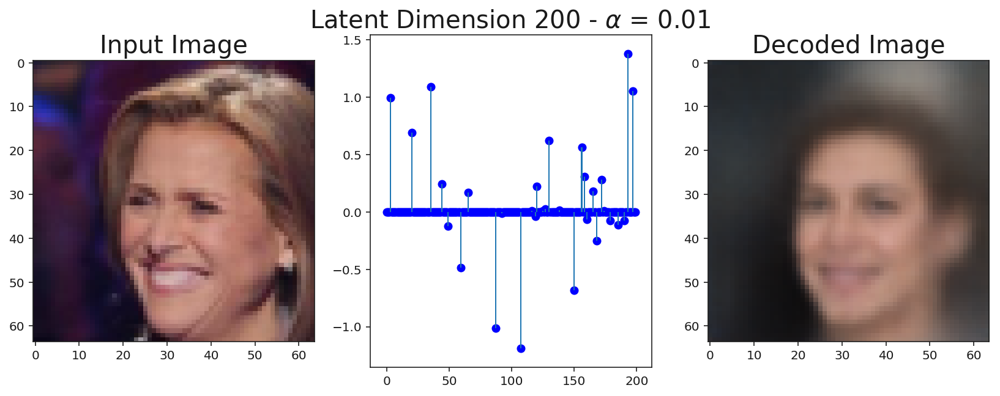

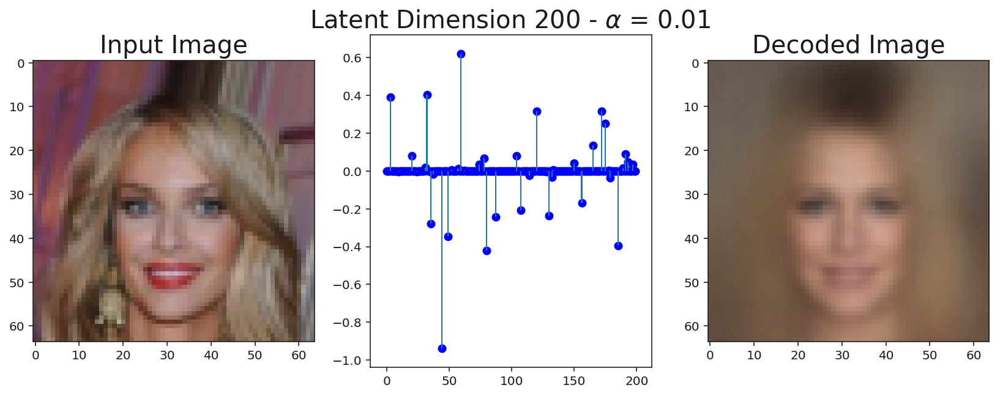

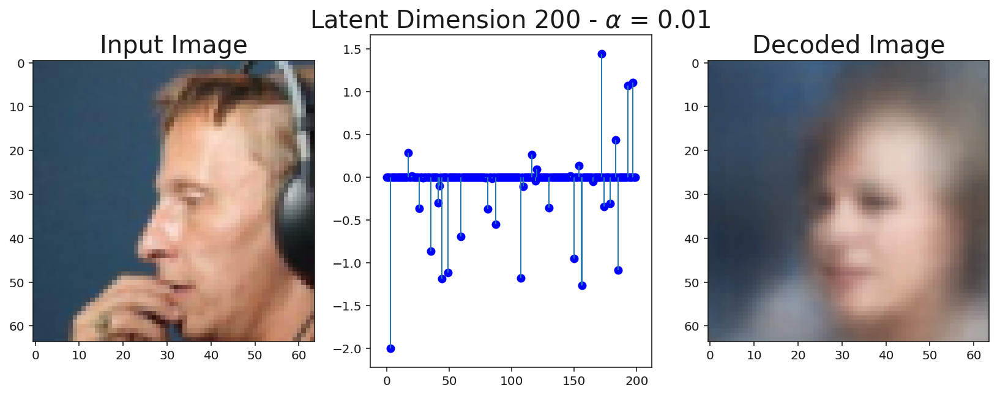

In [19]:
from src.plots import plot_encoding
for i in range(15, len(images)):
    plot_encoding(images[i][None,:], convvsc, 
                  200, 
                  0.01, width=1)

/home/raduviri/anaconda3/envs/chana/lib/python3.6/site-packages/torch/nn/functional.py:1332: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


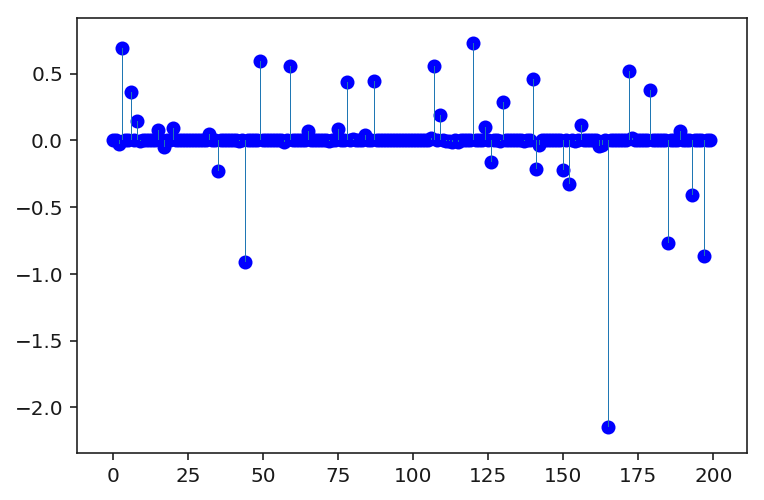

[197   8 141 109 165 172 189  35 109 141  59 140 165 172 109 152 193 156
 126]
[172]


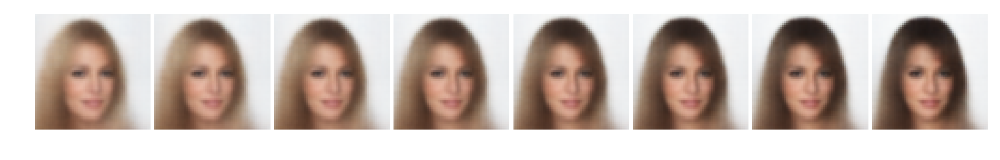

In [22]:
# test
from src.plots import plot_horizontal_traversal
plot_horizontal_traversal(images[0][None,:], convvsc, 
                          latent_sz=200, length=8, 
                          delta=0.28, threshold=0.05,
                          plot_all=False, 
                          plot_list=[172],
                          n_indices=19);

/home/raduviri/anaconda3/envs/chana/lib/python3.6/site-packages/torch/nn/functional.py:1332: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


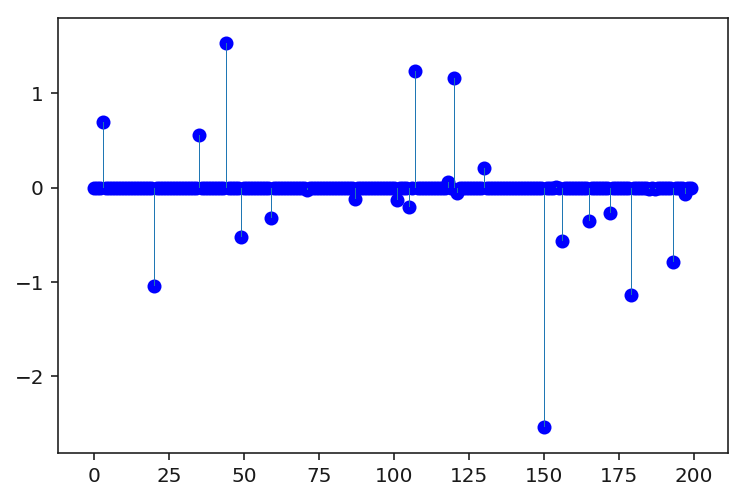

[101 179 156  87  59 107 118  59 165  20 118 156  44 172 197  59 101 121
  59]
[35]


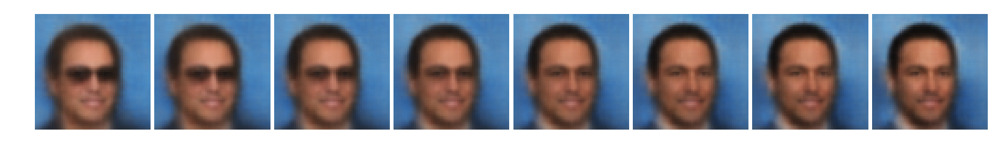

In [24]:
# test
from src.plots import plot_horizontal_traversal
plot_horizontal_traversal(images[28][None,:], convvsc, 
                          latent_sz=200, length=8, 
                          delta=0.4, threshold=0.05,
                          plot_all=False, 
                          plot_list=[35],
                          n_indices=19);

/home/raduviri/anaconda3/envs/chana/lib/python3.6/site-packages/torch/nn/functional.py:1332: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


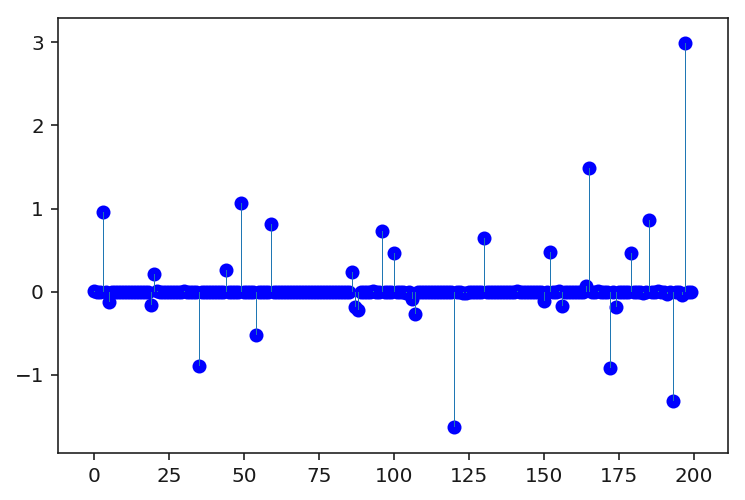

[ 86 152  54 193  86  86 185   5 165  20  20  86  44   5 100  96  44  87
 150]
[165]


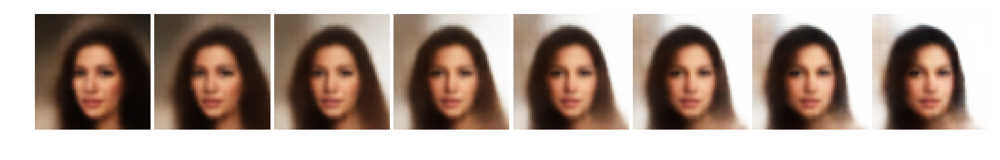

In [38]:
# test
from src.plots import plot_horizontal_traversal
plot_horizontal_traversal(images[19][None,:], convvsc, 
                          latent_sz=200, length=8, 
                          delta=1.2, threshold=0.05,
                          plot_all=False, 
                          plot_list=[165],
                          n_indices=19);

/home/raduviri/anaconda3/envs/chana/lib/python3.6/site-packages/torch/nn/functional.py:1332: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


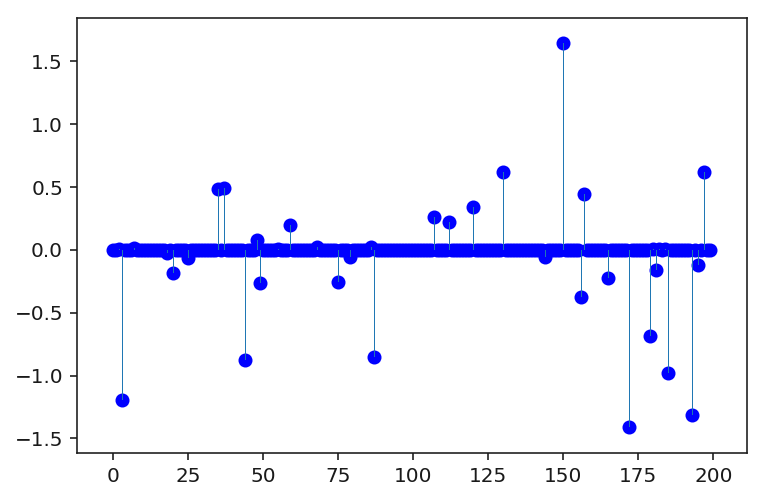

[  3 193 193 150 197 144 144  25  59 172 144 130 197 107 144  35 172 157
  87]
[197]


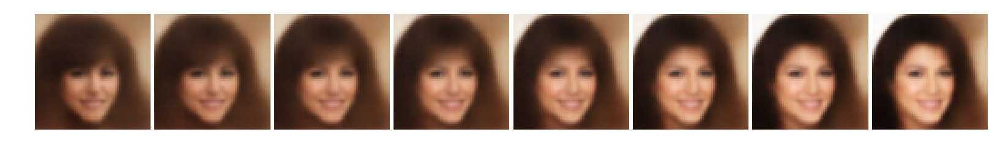

In [40]:
# test
from src.plots import plot_horizontal_traversal
plot_horizontal_traversal(images[18][None,:], convvsc, 
                          latent_sz=200, length=8, 
                          delta=0.6, threshold=0.05,
                          plot_all=False, 
                          plot_list=[197],
                          n_indices=19);

/home/raduviri/anaconda3/envs/chana/lib/python3.6/site-packages/torch/nn/functional.py:1332: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


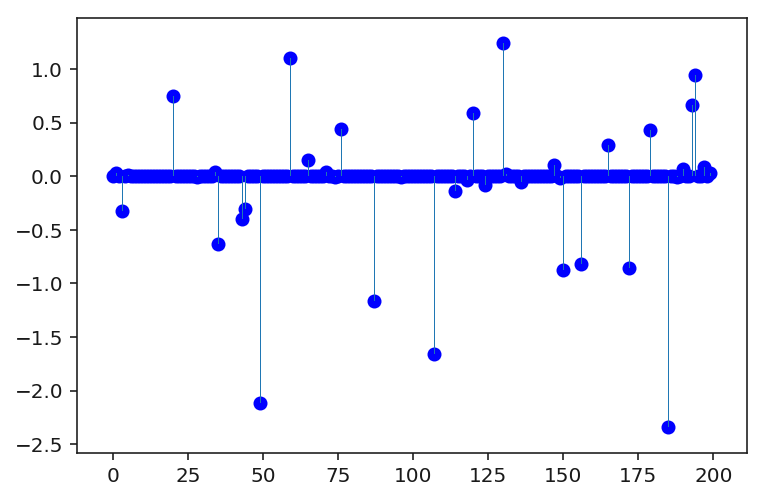

[130 150  49 124  65 136  49 194  44  59 179  35  87  43 120  76 114 172
   3]
[35]


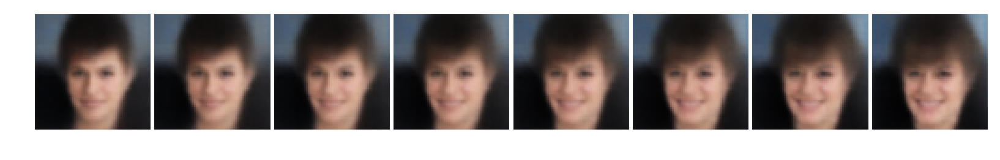

In [46]:
# test
from src.plots import plot_horizontal_traversal
plot_horizontal_traversal(images[23][None,:], convvsc, 
                          latent_sz=200, length=8, 
                          delta=0.5, threshold=0.05,
                          plot_all=False, 
                          plot_list=[35],
                          n_indices=19);

/home/raduviri/anaconda3/envs/chana/lib/python3.6/site-packages/torch/nn/functional.py:1332: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


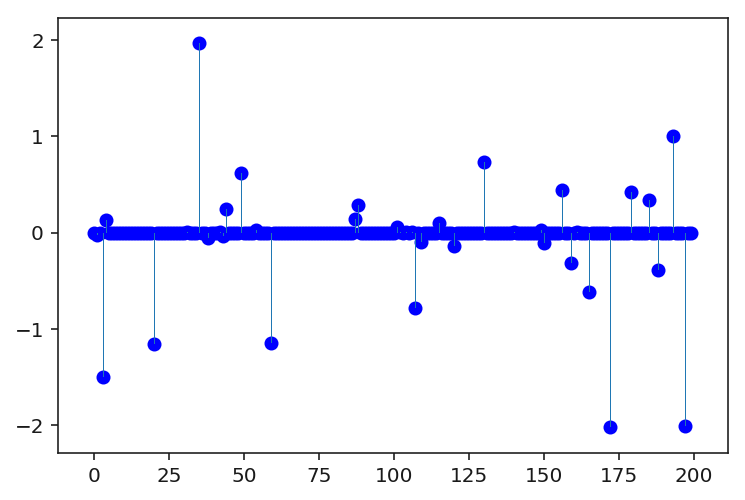

[  3 188 156 130 179 159 120 165 165  38 109 150 159 130 179 193 188 179
  20]
[3, 4, 20, 35, 38, 44, 49, 59, 87, 88, 101, 107, 109, 115, 120, 130, 150, 156, 159, 165, 172, 179, 185, 188, 193, 197]


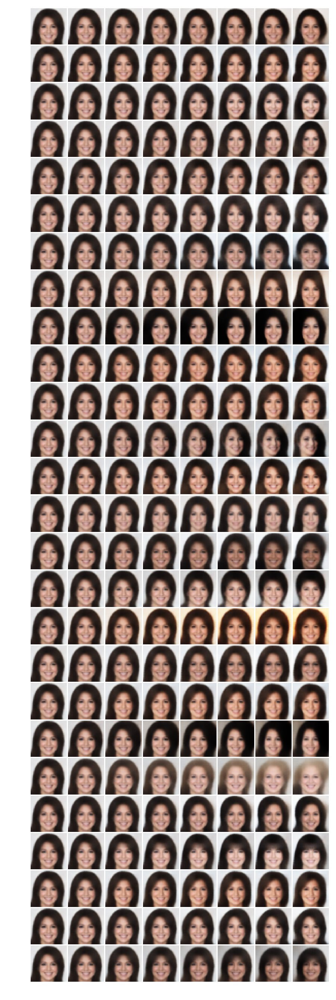

In [43]:
# test
from src.plots import plot_horizontal_traversal
plot_horizontal_traversal(images[24][None,:], convvsc, 
                          latent_sz=200, length=8, 
                          delta=0.5, threshold=0.05,
                          plot_all=True, 
                          plot_list=None,
                          n_indices=19);

/home/raduviri/anaconda3/envs/chana/lib/python3.6/site-packages/torch/nn/functional.py:1332: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


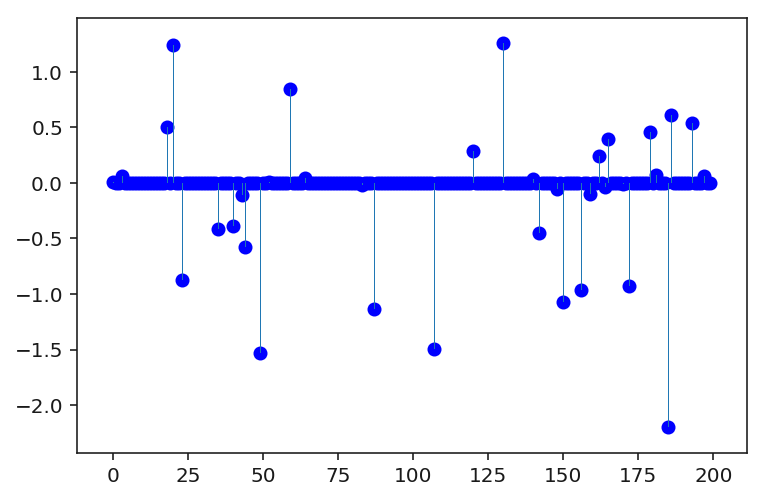

[181  49 148 179 186 172 150 181 120  49 186 142 130  18  44 142 148 186
 130]
[3, 18, 20, 23, 35, 40, 43, 44, 49, 59, 87, 107, 120, 130, 142, 148, 150, 156, 159, 162, 165, 172, 179, 181, 185, 186, 193, 197]


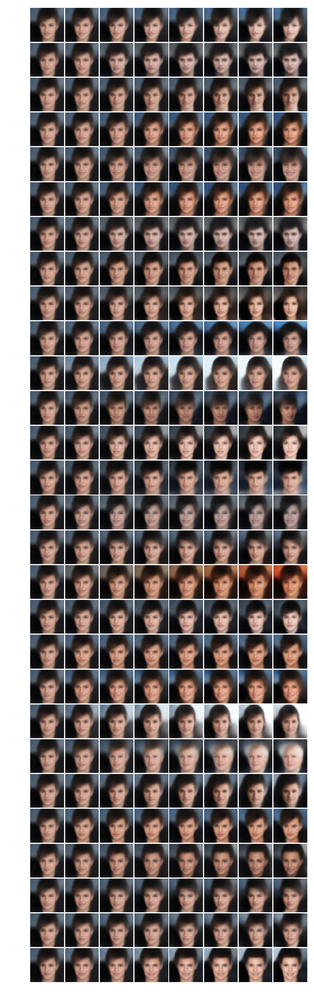

In [42]:
# test
from src.plots import plot_horizontal_traversal
plot_horizontal_traversal(images[23][None,:], convvsc, 
                          latent_sz=200, length=8, 
                          delta=0.5, threshold=0.05,
                          plot_all=True, 
                          plot_list=None,
                          n_indices=19);

/home/raduviri/anaconda3/envs/chana/lib/python3.6/site-packages/torch/nn/functional.py:1332: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


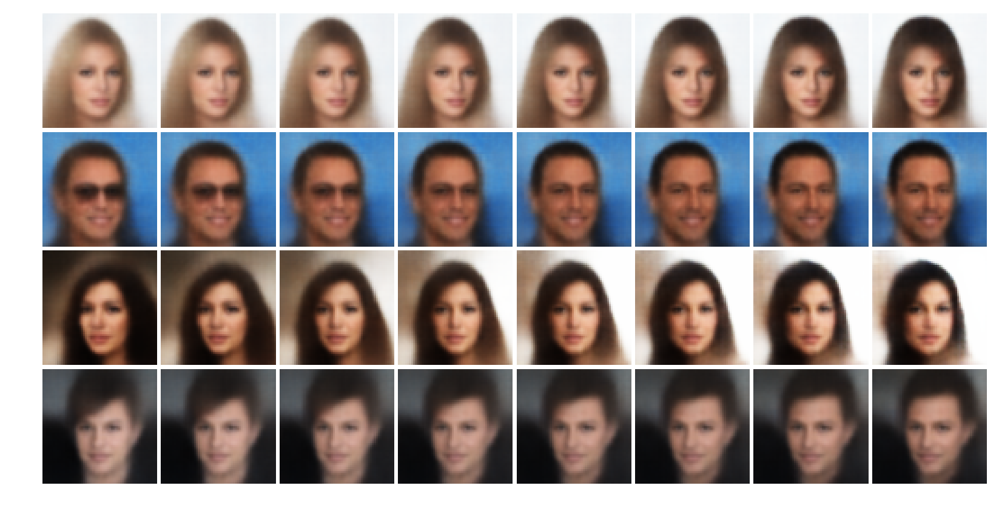

In [55]:
# 9 epochs
traversals = np.concatenate([
    plot_horizontal_traversal(images[img_idx][None,:], convvsc, 
                          200, length=8, 
                          delta=delta, threshold=0.01,
                          plot_all=False, 
                          plot_list=[dim],
                          n_indices=19, plot=False)
    for img_idx, delta, dim in [
        (0, 0.3, 172),
        (28, 0.4, 35),
        (19, 1.2, 165),
#         (18, 0.6, 197),
        (23, 0.4, 185)
    ]
])

plt.figure(figsize=(14,24))
plt.axis('off')
plt.imshow(traversals)
plt.show()

# ConvVAE

In [11]:
%%time
from src.models.conv_vae import ConvolutionalVariationalAutoEncoder

model_params = {
    'dataset': 'celeba64',
    'width': width,
    'height': height,
    'channels': channels,
    'kernel_szs': '32,32,64,64',
    'hidden_sz': 256,
    'latent_sz': 32,
    'learning_rate': 3e-4,
    
    'beta': 4,
    'beta_delta': 0,
    
    'device': 'cpu',
    'log_interval': 500,
    'normalize': False,
    'flatten': False,
}

convvae = ConvolutionalVariationalAutoEncoder(**model_params)

CPU times: user 16 ms, sys: 0 ns, total: 16 ms
Wall time: 15 ms


In [12]:
import torch
convvae.model.load_state_dict(torch.load(
    'results/checkpoints/ConvVAE_celeba64_1_90_32_0-0003_90.pth', 
    map_location='cpu'))

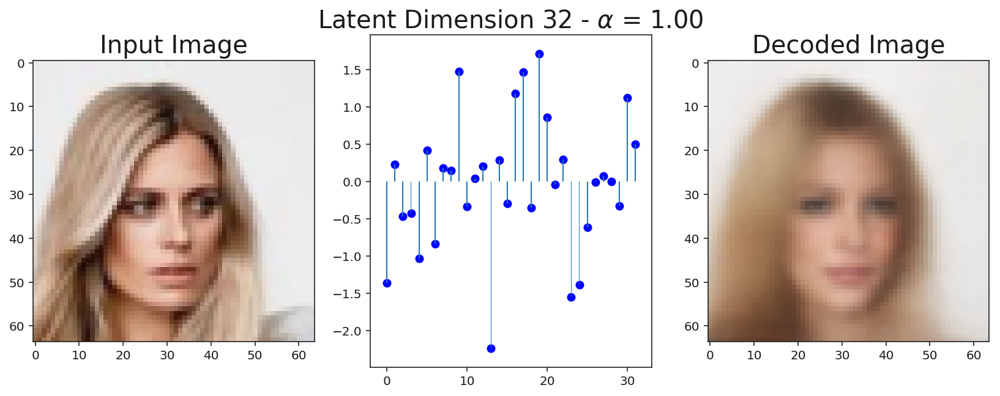

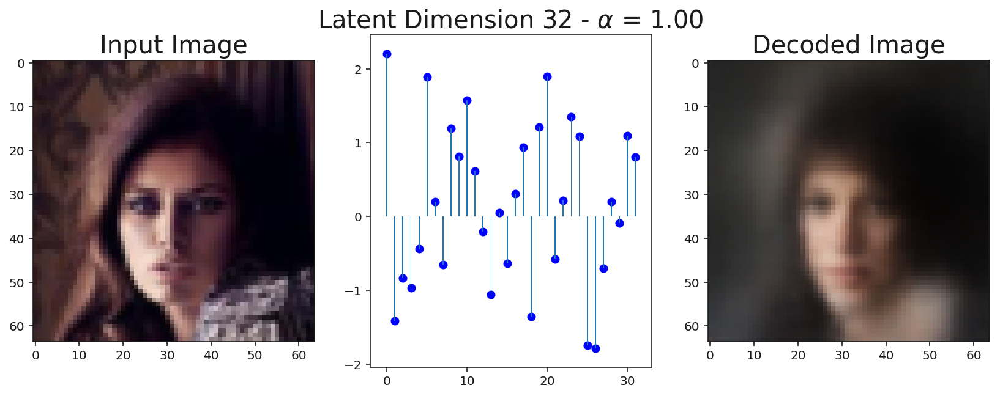

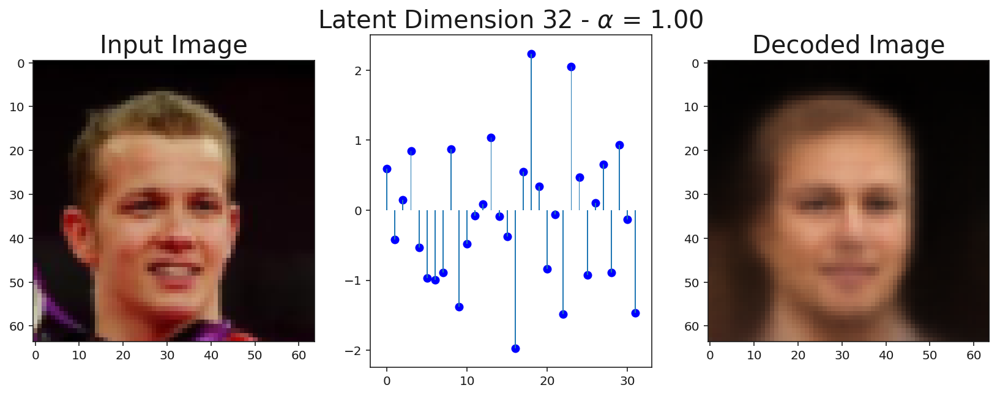

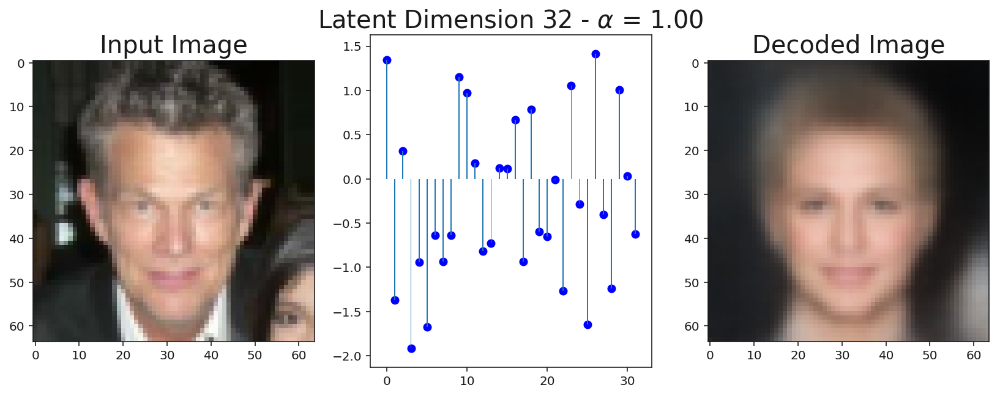

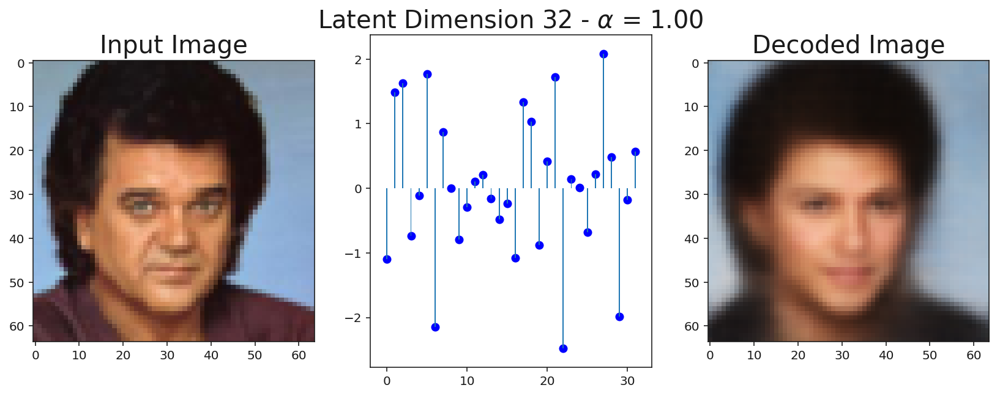

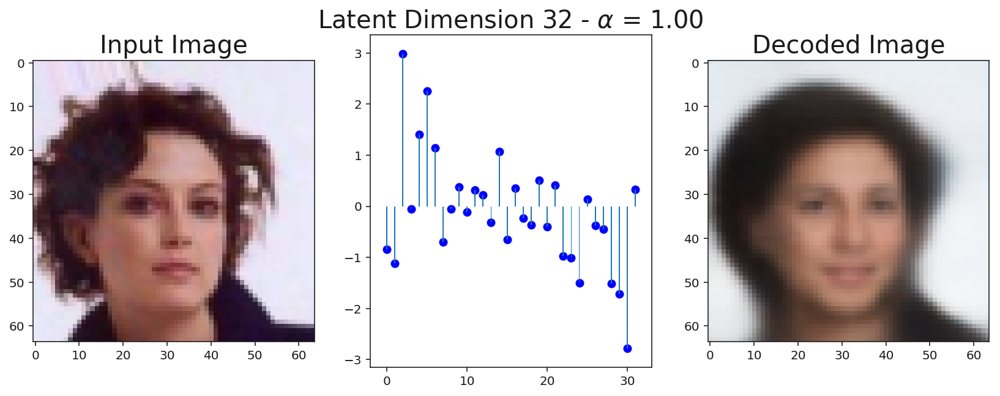

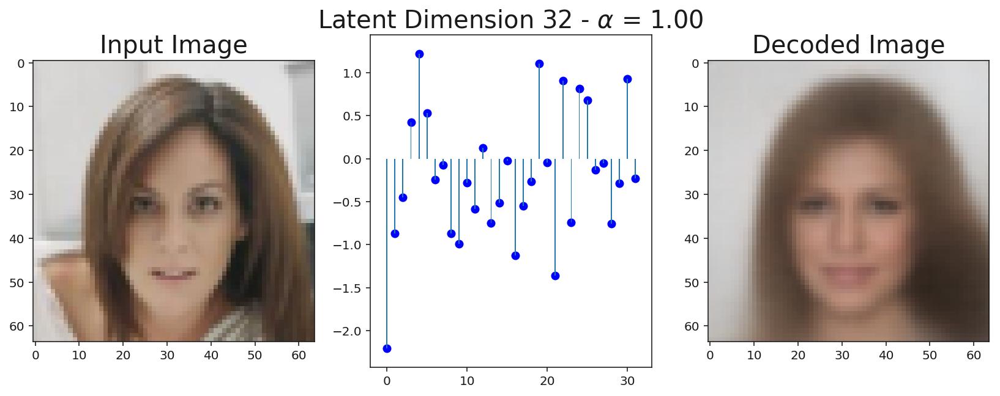

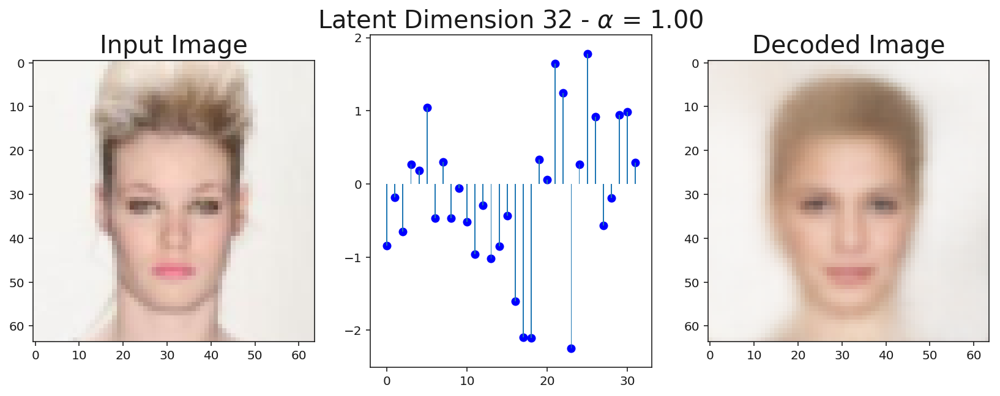

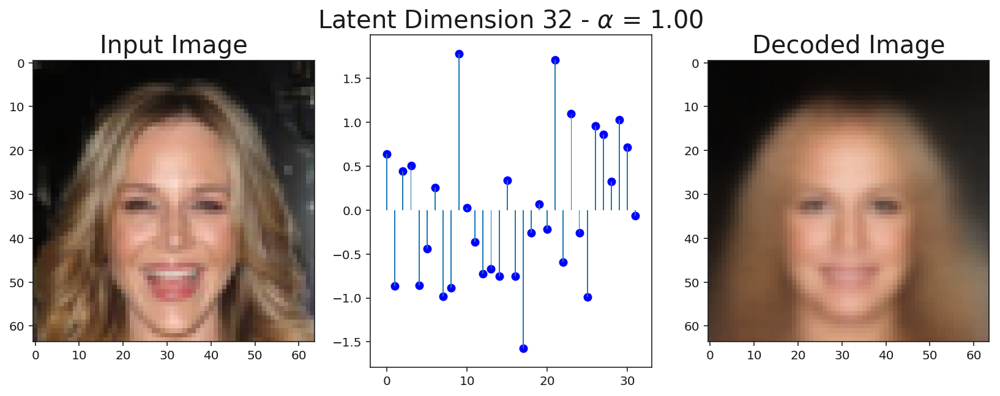

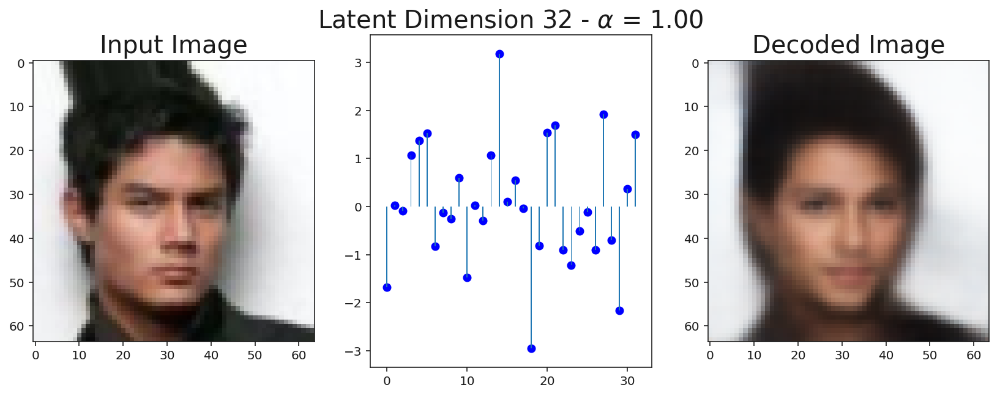

In [14]:
from src.plots import plot_encoding
for i in range(10):
    plot_encoding(images[i][None,:], convvae, 
                  model_params['latent_sz'], 1)

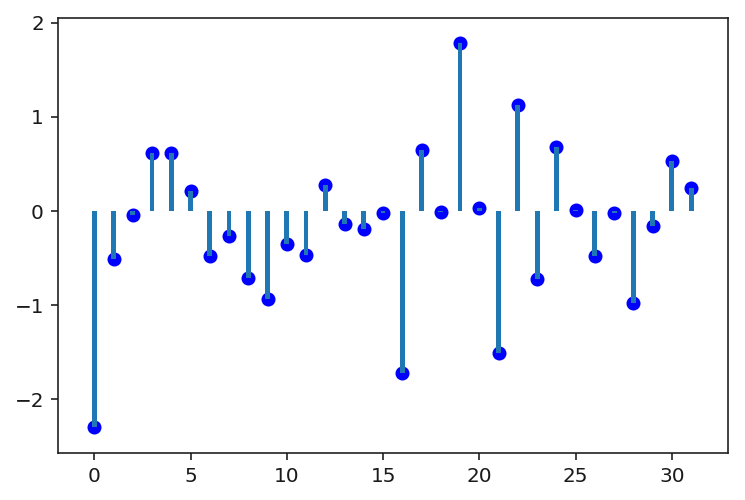

[ 0 29  1 24 15 23  2  7  7 12  8  4 10  0 15 26 26 19 30]
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 19, 20, 21, 22, 23, 24, 26, 27, 28, 29, 30, 31]


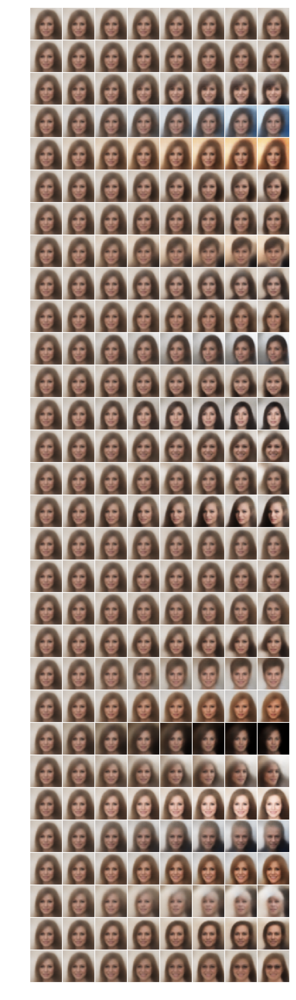

In [16]:
from src.plots import plot_horizontal_traversal
plot_horizontal_traversal(images[6][None,:], convvae, 
                          model_params['latent_sz'], length=8, 
                          delta=0.5, threshold=0.01,
                          plot_all=True, 
                          plot_list=None,
                          n_indices=19)

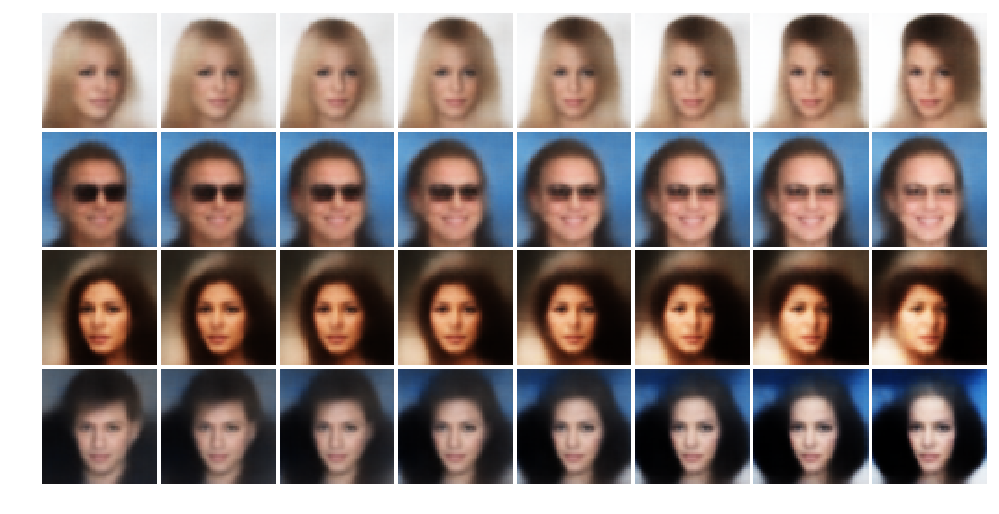

In [69]:
# 9 epochs
traversals = np.concatenate([
    plot_horizontal_traversal(images[img_idx][None,:], convvae, 
                          32, length=8, 
                          delta=delta, threshold=0.01,
                          plot_all=False, 
                          plot_list=[dim],
                          n_indices=19, plot=False)
    for img_idx, delta, dim in [
        (0, 0.6, 24),
        (28, 0.4, 26),
        (19, 0.8, 15),
        (23, 1.2, 7)
    ]
])

plt.figure(figsize=(14,24))
plt.axis('off')
plt.imshow(traversals)
plt.show()

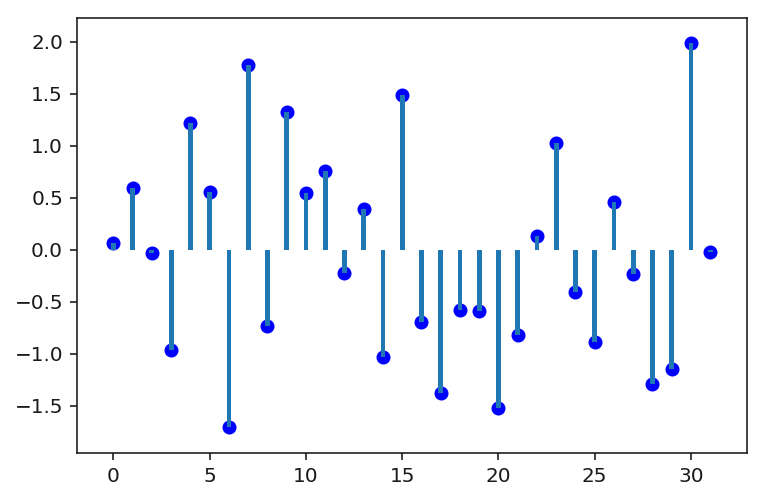

[27  3 20 19 29 27 15 15  0 14  3  5 17 21 22 10 22  9 14]
[0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30]


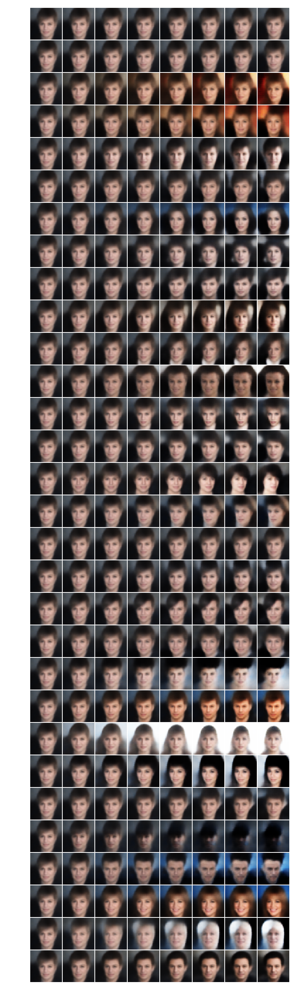

In [65]:
# test
from src.plots import plot_horizontal_traversal
plot_horizontal_traversal(images[23][None,:], convvae, 
                          latent_sz=32, length=8, 
                          delta=0.9, threshold=0.05,
                          plot_all=True, 
                          plot_list=None,
                          n_indices=19);

## TCVAE

In [ ]:
vae, dataset, cpargs = load_model_and_dataset(args.checkpt)